# Business Objective

Customer churn is a big problem for telecommunications companies. Indeed, their annual churn rates are usually higher than 10%. For that reason, they develop strategies to keep as many clients as possible. This is a classification project since the variable to be predicted is binary (churn or loyal customer). The goal here is to model churn probability, conditioned on the customer features.

# Steps Involved

1. EDA/Data Set Details
2. Feature Engineering
3. Model Building
4. Model Evaluation
5. Deployment/Feedback

# 1. EDA/Data Set Details

In [2]:
#! pip install pandas_profiling
#! pip install sweetviz

In [3]:
# Load the basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Read the data set
tel = pd.read_csv("telecommunications_churn (1).csv")
tel

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,1,36,156.2,215.5,279.1,9.9,2,0,77,26.55,126,18.32,83,12.56,6,2.67,60.10,0
3329,68,0,0,231.1,153.4,191.3,9.6,3,0,57,39.29,55,13.04,123,8.61,4,2.59,63.53,0
3330,28,0,0,180.8,288.8,191.9,14.1,2,0,109,30.74,58,24.55,91,8.64,6,3.81,67.74,0
3331,184,0,0,213.8,159.6,139.2,5.0,2,1,105,36.35,84,13.57,137,6.26,10,1.35,57.53,0


In [5]:
tel.head(10)

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0
5,118,0,0,223.4,220.6,203.9,6.3,0,1,98,37.98,101,18.75,118,9.18,6,1.70,67.61,0
6,121,1,24,218.2,348.5,212.6,7.5,3,0,88,37.09,108,29.62,118,9.57,7,2.03,78.31,0
7,147,0,0,157.0,103.1,211.8,7.1,0,1,79,26.69,94,8.76,96,9.53,6,1.92,46.90,0
8,117,0,0,184.5,351.6,215.8,8.7,1,0,97,31.37,80,29.89,90,9.71,4,2.35,73.32,0
9,141,1,37,258.6,222.0,326.4,11.2,0,1,84,43.96,111,18.87,97,14.69,5,3.02,80.54,0


In [6]:
# Check the different variables
tel.columns

Index(['account_length', 'voice_mail_plan', 'voice_mail_messages', 'day_mins',
       'evening_mins', 'night_mins', 'international_mins',
       'customer_service_calls', 'international_plan', 'day_calls',
       'day_charge', 'evening_calls', 'evening_charge', 'night_calls',
       'night_charge', 'international_calls', 'international_charge',
       'total_charge', 'churn'],
      dtype='object')

In [7]:
# Gives the count of the unique values for each column
tel.nunique()

account_length             212
voice_mail_plan              2
voice_mail_messages         46
day_mins                  1667
evening_mins              1611
night_mins                1591
international_mins         162
customer_service_calls      10
international_plan           2
day_calls                  119
day_charge                1667
evening_calls              123
evening_charge            1440
night_calls                120
night_charge               933
international_calls         21
international_charge       162
total_charge              2227
churn                        2
dtype: int64

In [8]:
type(tel)

pandas.core.frame.DataFrame

In [9]:
# Check the datatypes of the variables
tel.dtypes

account_length              int64
voice_mail_plan             int64
voice_mail_messages         int64
day_mins                  float64
evening_mins              float64
night_mins                float64
international_mins        float64
customer_service_calls      int64
international_plan          int64
day_calls                   int64
day_charge                float64
evening_calls               int64
evening_charge            float64
night_calls                 int64
night_charge              float64
international_calls         int64
international_charge      float64
total_charge              float64
churn                       int64
dtype: object

In [10]:
# The function .copy is used to save a copy of the dataset before applying transformations.
tel1 = tel.copy()
tel1

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,1,36,156.2,215.5,279.1,9.9,2,0,77,26.55,126,18.32,83,12.56,6,2.67,60.10,0
3329,68,0,0,231.1,153.4,191.3,9.6,3,0,57,39.29,55,13.04,123,8.61,4,2.59,63.53,0
3330,28,0,0,180.8,288.8,191.9,14.1,2,0,109,30.74,58,24.55,91,8.64,6,3.81,67.74,0
3331,184,0,0,213.8,159.6,139.2,5.0,2,1,105,36.35,84,13.57,137,6.26,10,1.35,57.53,0


In [11]:
# Give the total number of null values for each variable
tel1.isnull().sum()

account_length            0
voice_mail_plan           0
voice_mail_messages       0
day_mins                  0
evening_mins              0
night_mins                0
international_mins        0
customer_service_calls    0
international_plan        0
day_calls                 0
day_charge                0
evening_calls             0
evening_charge            0
night_calls               0
night_charge              0
international_calls       0
international_charge      0
total_charge              0
churn                     0
dtype: int64

In [12]:
tel1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account_length          3333 non-null   int64  
 1   voice_mail_plan         3333 non-null   int64  
 2   voice_mail_messages     3333 non-null   int64  
 3   day_mins                3333 non-null   float64
 4   evening_mins            3333 non-null   float64
 5   night_mins              3333 non-null   float64
 6   international_mins      3333 non-null   float64
 7   customer_service_calls  3333 non-null   int64  
 8   international_plan      3333 non-null   int64  
 9   day_calls               3333 non-null   int64  
 10  day_charge              3333 non-null   float64
 11  evening_calls           3333 non-null   int64  
 12  evening_charge          3333 non-null   float64
 13  night_calls             3333 non-null   int64  
 14  night_charge            3333 non-null   

###  This shows that there are no null values in the dataset

In [13]:
tel.describe()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,0.276628,8.099010,179.775098,200.980348,200.872037,10.237294,1.562856,0.096910,100.435644,30.562307,100.114311,17.083540,100.107711,9.039325,4.479448,2.764581,59.449754,0.144914
std,39.822106,0.447398,13.688365,54.467389,50.713844,50.573847,2.791840,1.315491,0.295879,20.069084,9.259435,19.922625,4.310668,19.568609,2.275873,2.461214,0.753773,10.502261,0.352067
min,1.000000,0.000000,0.000000,0.000000,0.000000,23.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,1.040000,0.000000,0.000000,22.930000,0.000000
25%,74.000000,0.000000,0.000000,143.700000,166.600000,167.000000,8.500000,1.000000,0.000000,87.000000,24.430000,87.000000,14.160000,87.000000,7.520000,3.000000,2.300000,52.380000,0.000000
50%,101.000000,0.000000,0.000000,179.400000,201.400000,201.200000,10.300000,1.000000,0.000000,101.000000,30.500000,100.000000,17.120000,100.000000,9.050000,4.000000,2.780000,59.470000,0.000000
75%,127.000000,1.000000,20.000000,216.400000,235.300000,235.300000,12.100000,2.000000,0.000000,114.000000,36.790000,114.000000,20.000000,113.000000,10.590000,6.000000,3.270000,66.480000,0.000000
max,243.000000,1.000000,51.000000,350.800000,363.700000,395.000000,20.000000,9.000000,1.000000,165.000000,59.640000,170.000000,30.910000,175.000000,17.770000,20.000000,5.400000,96.150000,1.000000


## Duplicates

In [14]:
# Total no of duplicated rows
tel1[tel1.duplicated()].shape

(0, 19)

In [15]:
tel1.duplicated().sum()

0

It shows that there are no duplicate rows in the dataset

In [16]:
stay = tel1[(tel1['churn'] ==0) ].count()[1]
churn = tel1[(tel1['churn'] ==1) ].count()[1]
print ("No. of users who stay: "+ str(stay))
print ("No. of users who churn: "+ str(churn))

No. of users who stay: 2850
No. of users who churn: 483


In [17]:
# Visualizing Churn proportion
import plotly.express as px
fig = px.pie(tel1, names = 'churn', template = 'seaborn',
            title = 'Churn')
fig.update_traces(rotation=90, pull = [0.1], textinfo = "percent+label")
fig.show()

In [19]:
#Function to plot all the categorical independent variables with the target variable

def CategoricalDataAnalysisPlot(tel1,var,target_var):
    fig, ax =plt.subplots(1,2)
    sns.set(rc = {'figure.figsize':(15,8)})
    sns.countplot(data=tel1,x=var,
                       hue=target_var,
                       palette=['skyblue','orangered'], ax=ax[0])
    ax[0].set(xlabel=var, ylabel='Count')
    percentageplot(ax[0],len(tel1))
    plt.tight_layout()

    sns.histplot(binwidth=0.5, x=var, hue=target_var,
                 data=tel1, stat="count", 
                 multiple="stack",
                 palette=['skyblue','orangered'],ax=ax[1])
    fig.tight_layout()
    plt.show()

## Outlier Detection

array([[<AxesSubplot:title={'center':'account_length'}>,
        <AxesSubplot:title={'center':'voice_mail_plan'}>,
        <AxesSubplot:title={'center':'voice_mail_messages'}>,
        <AxesSubplot:title={'center':'day_mins'}>],
       [<AxesSubplot:title={'center':'evening_mins'}>,
        <AxesSubplot:title={'center':'night_mins'}>,
        <AxesSubplot:title={'center':'international_mins'}>,
        <AxesSubplot:title={'center':'customer_service_calls'}>],
       [<AxesSubplot:title={'center':'international_plan'}>,
        <AxesSubplot:title={'center':'day_calls'}>,
        <AxesSubplot:title={'center':'day_charge'}>,
        <AxesSubplot:title={'center':'evening_calls'}>],
       [<AxesSubplot:title={'center':'evening_charge'}>,
        <AxesSubplot:title={'center':'night_calls'}>,
        <AxesSubplot:title={'center':'night_charge'}>,
        <AxesSubplot:title={'center':'international_calls'}>],
       [<AxesSubplot:title={'center':'international_charge'}>,
        <AxesSubplot:

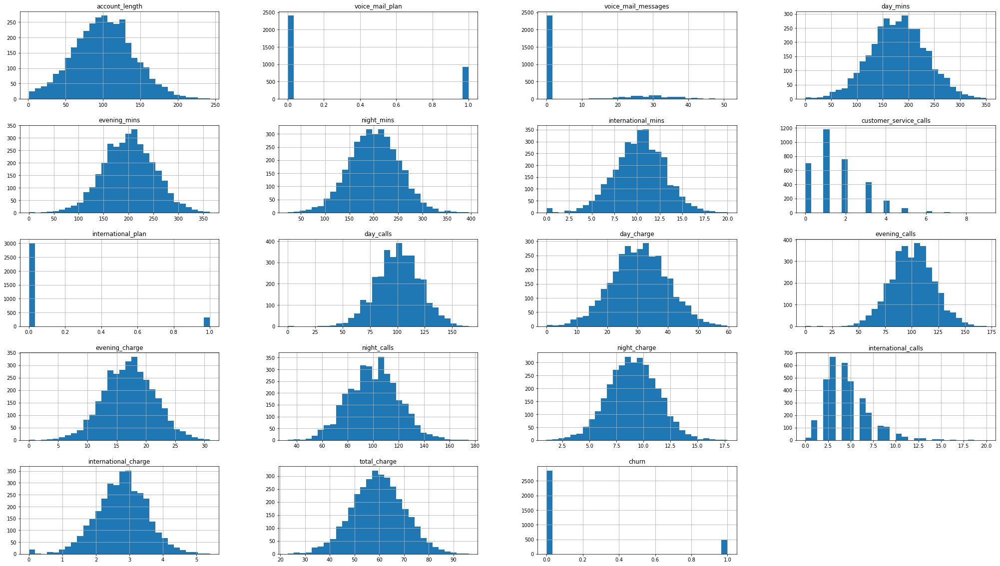

In [16]:
# Histogram to see the distribution of all the variables
tel1.hist(bins = 30, figsize=(35,20))

<AxesSubplot:>

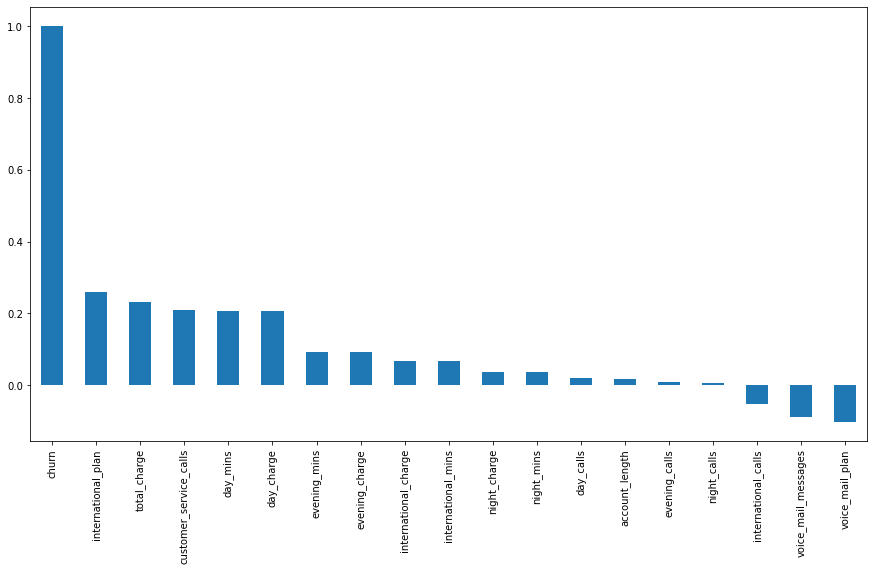

In [20]:
#Get Correlation of "Churn" with other variables:
plt.figure(figsize=(15,8))
tel1.corr()['churn'].sort_values(ascending = False).plot(kind='bar')

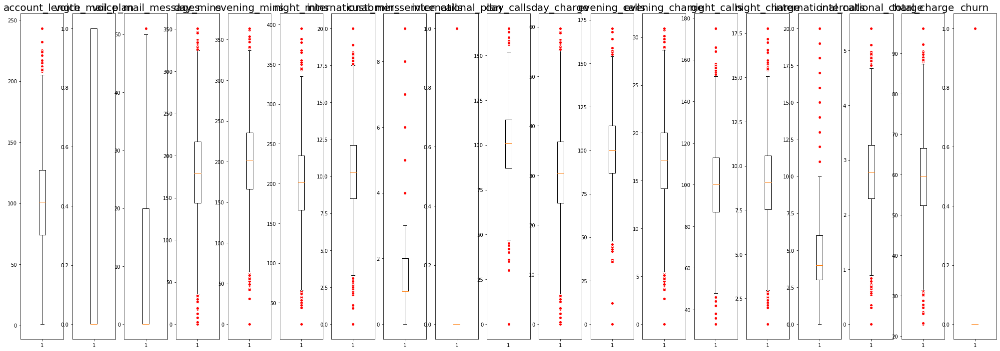

In [21]:
#Creating subplot of each column with its own scale
%matplotlib inline
red_circle = dict(markerfacecolor='red', marker='o', markeredgecolor='white')

fig, axs = plt.subplots(1, len(tel1.columns), figsize=(35,12))

for i, ax in enumerate(axs.flat):
    ax.boxplot(tel1.iloc[:,i], flierprops=red_circle)
    ax.set_title(tel1.columns[i], fontsize=20)
    ax.tick_params(axis='y', labelsize=10)


<AxesSubplot:>

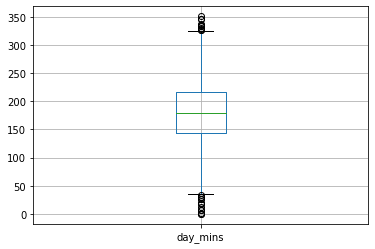

In [22]:
# Boxplot of the variable 'day_mins' for outlier detection
tel1.boxplot(column=['day_mins'])

<AxesSubplot:>

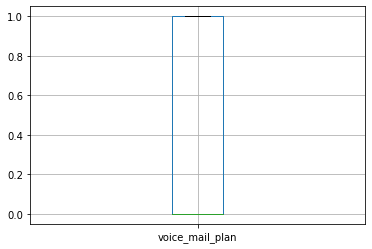

In [23]:
# Boxplots of the variable 'voice mail plan' for outlier detection
tel1.boxplot(column=['voice_mail_plan'])

Can be seen that there are no outliers

<AxesSubplot:>

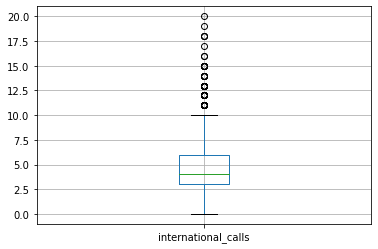

In [18]:
# Boxplot of the variable 'international_calls' for outlier detection
tel1.boxplot(column=['international_calls'])

In [24]:
#min-max threshold values for day_mins column
min_day,max_day=tel1.day_mins.quantile([0.001,0.999])
min_day,max_day

(7.8332, 336.7692000000011)

In [25]:
tel1[tel1.day_mins<min_day]

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
1345,98,0,0,0.0,159.6,167.1,6.8,4,0,0,0.00,130,13.57,88,7.52,1,1.84,22.93,1
1397,101,0,0,0.0,192.1,168.8,7.2,1,0,0,0.00,119,16.33,95,7.60,4,1.94,25.87,0
2736,127,1,27,2.6,254.0,242.7,9.2,3,0,113,0.44,102,21.59,156,10.92,5,2.48,35.43,0
2753,134,0,0,7.8,171.4,186.5,12.9,2,0,86,1.33,100,14.57,80,8.39,2,3.48,27.77,0


In [26]:
tel1[tel1.day_mins>max_day]

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
156,83,0,0,337.4,227.4,153.9,15.8,0,0,120,57.36,116,19.33,114,6.93,7,4.27,87.89,1
365,154,0,0,350.8,216.5,253.9,10.1,1,0,75,59.64,94,18.40,100,11.43,9,2.73,92.20,1
985,64,0,0,346.8,249.5,275.4,13.3,1,1,55,58.96,79,21.21,102,12.39,9,3.59,96.15,1
2594,115,0,0,345.3,203.4,217.5,11.8,1,1,81,58.70,106,17.29,107,9.79,8,3.19,88.97,1


In [27]:
tel1['day_mins']=np.where(tel1['day_mins']< min_day, min_day, tel1['day_mins'])

In [28]:
tel1['day_mins']=np.where(tel1['day_mins']> max_day, max_day, tel1['day_mins'])

In [29]:
tel1['day_mins'].describe()

count    3333.00000
mean      179.77141
std        54.41736
min         7.83320
25%       143.70000
50%       179.40000
75%       216.40000
max       336.76920
Name: day_mins, dtype: float64

<AxesSubplot:>

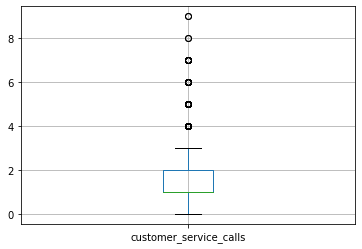

In [30]:
# Boxplot of the variable 'day_mins' for outlier detection
tel1.boxplot(column=['customer_service_calls'])

In [31]:
#min-max threshold values for customer_service_calls column
min_cust,max_cust=tel1.customer_service_calls.quantile([0.001,0.999])
min_cust,max_cust

(0.0, 7.668000000000575)

In [32]:
tel1['customer_service_calls'].describe()

count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: customer_service_calls, dtype: float64

In [33]:
tel1['customer_service_calls']=np.where(tel1['customer_service_calls']> max_cust, max_cust, tel1['customer_service_calls'])

In [34]:
tel1['customer_service_calls'].describe()

count    3333.000000
mean        1.561858
std         1.310416
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         7.668000
Name: customer_service_calls, dtype: float64

<AxesSubplot:>

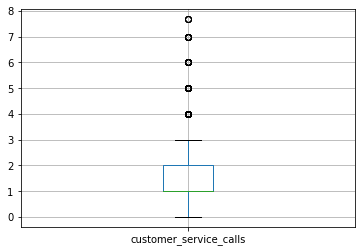

In [35]:
tel1.boxplot(column=['customer_service_calls'])

<AxesSubplot:>

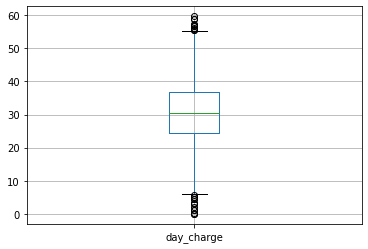

In [36]:
# Boxplot of the variable 'day_charge' for outlier detection
tel1.boxplot(column=['day_charge'])

In [37]:
#min-max threshold values for customer_service_calls column
min_daycharge,max_daycharge=tel1.day_charge.quantile([0.001,0.999])
min_daycharge,max_daycharge

(1.33332, 57.253760000000185)

In [38]:
tel1['day_charge'].describe()

count    3333.000000
mean       30.562307
std         9.259435
min         0.000000
25%        24.430000
50%        30.500000
75%        36.790000
max        59.640000
Name: day_charge, dtype: float64

In [39]:
tel1['day_charge']=np.where(tel1['day_charge']< min_daycharge, min_daycharge, tel1['day_charge'])

In [40]:
tel1['day_charge']=np.where(tel1['day_charge']> max_daycharge, max_daycharge, tel1['day_charge'])

In [41]:
tel1['day_charge'].describe()

count    3333.000000
mean       30.561683
std         9.250927
min         1.333320
25%        24.430000
50%        30.500000
75%        36.790000
max        57.253760
Name: day_charge, dtype: float64

<AxesSubplot:>

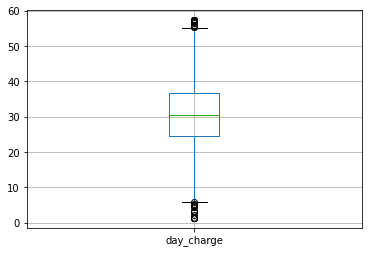

In [42]:
tel1.boxplot(column=['day_charge'])

<AxesSubplot:>

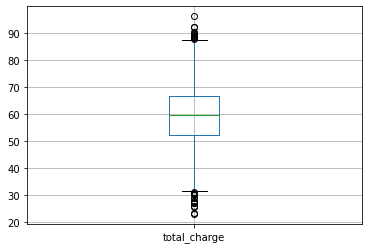

In [43]:
# Boxplot of the variable 'day_mins' for outlier detection
tel1.boxplot(column=['total_charge'])

In [44]:
#min-max threshold values for total_charge column
min_totalcharge,max_totalcharge=tel1.total_charge.quantile([0.001,0.999])
min_totalcharge,min_totalcharge

(26.2518, 26.2518)

In [45]:
tel1['total_charge'].describe()

count    3333.000000
mean       59.449754
std        10.502261
min        22.930000
25%        52.380000
50%        59.470000
75%        66.480000
max        96.150000
Name: total_charge, dtype: float64

In [46]:
tel1['total_charge']=np.where(tel1['total_charge']< min_totalcharge, min_totalcharge, tel1['total_charge'])

In [47]:
tel1['total_charge']=np.where(tel1['total_charge']> max_totalcharge, max_totalcharge, tel1['total_charge'])

In [48]:
tel1['total_charge'].describe()

count    3333.000000
mean       59.449072
std        10.485737
min        26.251800
25%        52.380000
50%        59.470000
75%        66.480000
max        90.347120
Name: total_charge, dtype: float64

<AxesSubplot:>

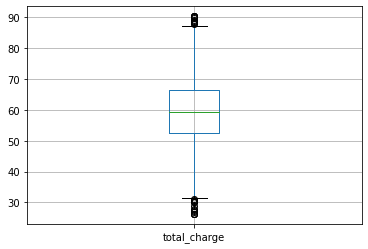

In [49]:
tel1.boxplot(column=['total_charge'])

In [50]:
tel1

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1.0,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1.0,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0.0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2.0,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3.0,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,1,36,156.2,215.5,279.1,9.9,2.0,0,77,26.55,126,18.32,83,12.56,6,2.67,60.10,0
3329,68,0,0,231.1,153.4,191.3,9.6,3.0,0,57,39.29,55,13.04,123,8.61,4,2.59,63.53,0
3330,28,0,0,180.8,288.8,191.9,14.1,2.0,0,109,30.74,58,24.55,91,8.64,6,3.81,67.74,0
3331,184,0,0,213.8,159.6,139.2,5.0,2.0,1,105,36.35,84,13.57,137,6.26,10,1.35,57.53,0


In [51]:
tel1.corr()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
account_length,1.000000,0.002918,-0.004628,0.006171,-0.006757,-0.008955,0.009514,-0.003766,0.024735,0.038470,0.006169,0.019260,-0.006745,-0.013176,-0.008960,0.020661,0.009546,0.001401,0.016541
voice_mail_plan,0.002918,1.000000,0.956927,-0.001579,0.021545,0.006079,-0.001318,-0.018274,0.006006,-0.011086,-0.001581,-0.006444,0.021559,0.015553,0.006064,0.007618,-0.001276,0.008686,-0.102148
voice_mail_messages,-0.004628,0.956927,1.000000,0.000876,0.017562,0.007681,0.002856,-0.013531,0.008745,-0.009548,0.000873,-0.005864,0.017578,0.007123,0.007663,0.013957,0.002884,0.009852,-0.089728
day_mins,0.006171,-0.001579,0.000876,1.000000,0.006956,0.004120,-0.010365,-0.013912,0.049117,0.006608,1.000000,0.015958,0.006942,0.023014,0.004097,0.007663,-0.010303,0.884564,0.204970
evening_mins,-0.006757,0.021545,0.017562,0.006956,1.000000,-0.012584,-0.011035,-0.012940,0.019100,-0.021451,0.006963,-0.011430,1.000000,0.007586,-0.012593,0.002541,-0.011067,0.413277,0.092796
night_mins,-0.008955,0.006079,0.007681,0.004120,-0.012584,1.000000,-0.015207,-0.009853,-0.028905,0.022938,0.004121,-0.002093,-0.012592,0.011204,0.999999,-0.012353,-0.015180,0.214180,0.035493
international_mins,0.009514,-0.001318,0.002856,-0.010365,-0.011035,-0.015207,1.000000,-0.009981,0.045871,0.021565,-0.010367,0.008703,-0.011043,-0.013605,-0.015214,0.032304,0.999993,0.054899,0.068239
customer_service_calls,-0.003766,-0.018274,-0.013531,-0.013912,-0.012940,-0.009853,-0.009981,1.000000,-0.025398,-0.019717,-0.013915,0.002119,-0.012943,-0.012902,-0.009841,-0.017232,-0.010015,-0.020573,0.207923
international_plan,0.024735,0.006006,0.008745,0.049117,0.019100,-0.028905,0.045871,-0.025398,1.000000,0.003755,0.049120,0.006114,0.019106,0.012451,-0.028913,0.017366,0.045780,0.047951,0.259852
day_calls,0.038470,-0.011086,-0.009548,0.006608,-0.021451,0.022938,0.021565,-0.019717,0.003755,1.000000,0.006610,0.006462,-0.021449,-0.019557,0.022927,0.004574,0.021666,0.003737,0.018459


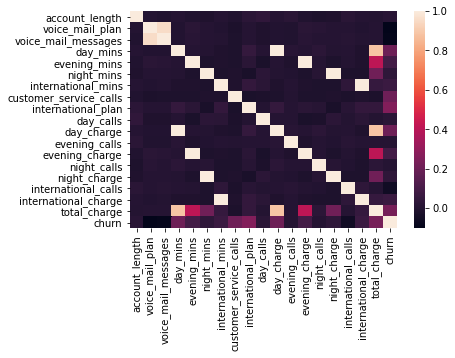

In [20]:
dataplot = sns.heatmap(tel1.corr())

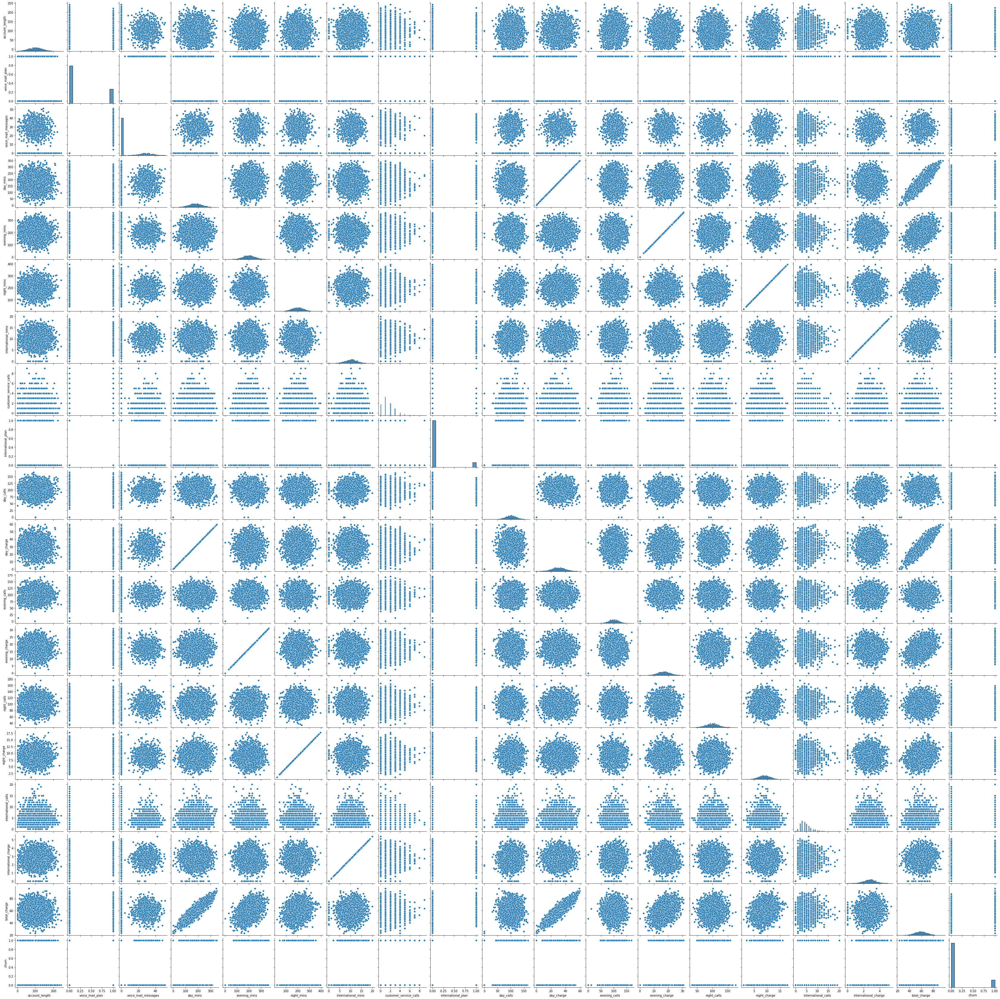

In [21]:
sns.pairplot(tel1)

C:\Users\saiki\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_charge', ylabel='Density'>

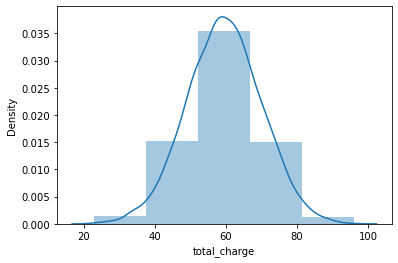

In [23]:
sns.distplot(tel1['total_charge'], bins=5)

In [52]:
#we will normalize our data so the prediction on all features will be at the same scale
X = tel1.iloc[:,0:18].values
Y = tel1.iloc[:,18].values
#normalize the data
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)
dfNorm = pd.DataFrame(X_std, index=tel1.index, columns=tel1.columns[0:18])
# # add non-feature target column to dataframe
dfNorm['churn'] = tel1['churn']
dfNorm.head(10)


,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,0.676489,1.617086,1.234883,1.568275,-0.070610,0.866743,-0.085008,-0.428827,-0.327580,0.476643,1.568545,-0.055940,-0.070427,-0.465494,0.866029,-0.601195,-0.085690,1.536692,0
1,0.149065,1.617086,1.307948,-0.333977,-0.108080,1.058571,1.240482,-0.428827,-0.327580,1.124503,-0.334253,0.144867,-0.107549,0.147825,1.059390,-0.601195,1.241169,-0.019942,0
2,0.902529,-0.618396,-0.591760,1.169446,-1.573383,-0.756869,0.703121,-1.192059,-0.327580,0.675985,1.169606,0.496279,-1.573900,0.198935,-0.755571,0.211534,0.697156,0.270973,0
3,-0.428590,-0.618396,-0.591760,2.198683,-2.742865,-0.078551,-1.303026,0.334404,3.052685,-1.466936,2.198847,-0.608159,-2.743268,-0.567714,-0.078806,1.024263,-1.306401,0.701146,0
4,-0.654629,-0.618396,-0.591760,-0.240243,-1.038932,-0.276311,-0.049184,1.097635,3.052685,0.626149,-0.240194,1.098699,-1.037939,1.067803,-0.276562,-0.601195,-0.045885,-0.701923,0
5,0.425335,-0.618396,-0.591760,0.801861,0.386928,0.059881,-1.410498,-1.192059,3.052685,-0.121381,0.802020,0.044463,0.386648,0.914473,0.061821,0.617898,-1.412550,0.778405,0
6,0.500681,1.617086,1.161817,0.706289,2.909300,0.231933,-0.980610,1.097635,-0.327580,-0.619735,0.705799,0.395875,2.908677,0.914473,0.233209,1.024263,-0.974686,1.798992,0
7,1.153683,-0.618396,-0.591760,-0.418521,-1.930341,0.216112,-1.123906,-1.192059,3.052685,-1.068253,-0.418581,-0.306949,-1.931206,-0.209945,0.215631,0.617898,-1.120641,-1.196955,0
8,0.400220,-0.618396,-0.591760,0.086908,2.970436,0.295216,-0.550721,-0.428827,-0.327580,-0.171217,0.087390,-1.009773,2.971322,-0.516604,0.294733,-0.194831,-0.550091,1.323036,0
9,1.002990,1.617086,2.111671,1.448810,0.414538,2.482445,0.344880,-1.192059,3.052685,-0.819076,1.448539,0.546480,0.414490,-0.158835,2.483233,0.211534,0.338904,2.011694,0


In [53]:
X = dfNorm.iloc[:,0:18].values
Y = dfNorm.iloc[:,18].values

In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

X_train.shape, Y_train.shape, X_test.shape , Y_test.shape

((2333, 18), (2333,), (1000, 18), (1000,))

In [55]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn import metrics
import seaborn as sns

In [56]:
lr=LogisticRegression()
lr.fit(X_train,Y_train)
print(lr.score(X_test,Y_test))

0.865


In [57]:
predict=lr.predict(X_test)
predict

array([0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,

In [58]:
cm=confusion_matrix(Y_test,predict)

<AxesSubplot:>

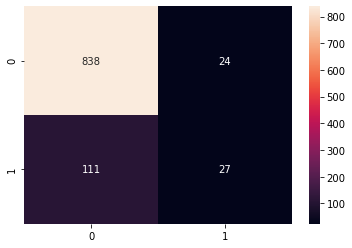

In [59]:
sns.heatmap(cm,annot=True,fmt='d')

In [60]:
print(classification_report(Y_test, lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      0.97      0.93       862
           1       0.53      0.20      0.29       138

    accuracy                           0.86      1000
   macro avg       0.71      0.58      0.61      1000
weighted avg       0.83      0.86      0.84      1000



In [61]:
rf=RandomForestClassifier()
rf.fit(X_train,Y_train)
print(rf.score(X_test,Y_test))

0.978


In [62]:
predict1=rf.predict(X_test)
predict1

array([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,

In [63]:
cm1=confusion_matrix(Y_test,predict1)

<AxesSubplot:>

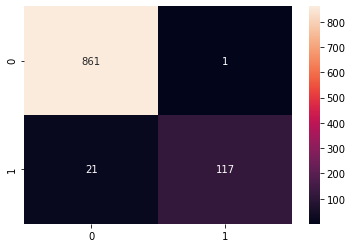

In [64]:
sns.heatmap(cm1,annot=True,fmt='d')

In [65]:
print(classification_report(Y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       862
           1       0.99      0.85      0.91       138

    accuracy                           0.98      1000
   macro avg       0.98      0.92      0.95      1000
weighted avg       0.98      0.98      0.98      1000



In [66]:
dt=DecisionTreeClassifier()

In [76]:
dt.fit(X_train, Y_train)
print(dt.score(X_test, Y_test))

0.947


In [77]:
dt.fit(X_train, Y_train)
print(dt.score(X_test, Y_test))

0.95


In [78]:
predict2=dt.predict(X_test)
predict2

array([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,

In [79]:
cm2=confusion_matrix(Y_test,predict2)

<AxesSubplot:>

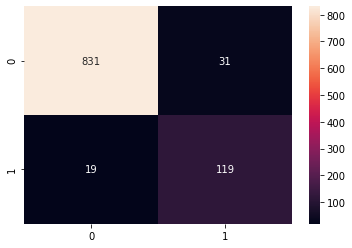

In [80]:
sns.heatmap(cm2,annot=True,fmt='d')

In [81]:
print(classification_report(Y_test, dt.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       862
           1       0.79      0.86      0.83       138

    accuracy                           0.95      1000
   macro avg       0.89      0.91      0.90      1000
weighted avg       0.95      0.95      0.95      1000

